In [7]:
import os
import pandas as pd
import numpy as np
import re
from statsmodels.stats.outliers_influence import variance_inflation_factor
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
# Set working directory here
WD = '../..'

In [9]:
df = pd.read_csv(os.path.join(WD, 'data/data_processed/all_risk_processed.csv'))

In [10]:
df['spin_surg'] = np.where(df['prior_surg'] == 0 & np.isnan(df['spin_surg']),
                           0, df['spin_surg'])
df['succ_surg'] = np.where(df['prior_surg'] == 0 & np.isnan(df['succ_surg']),
                           0, df['succ_surg'])

In [11]:
corr_df = df.filter(regex='odi_final|spinal_risk_score|age$|sex|height_m|weight_kg|ethni|income|educa|_surg|bmi|dospert_|ADI_').copy()
corr_df['ADI_NATRANK'] = pd.to_numeric(corr_df['ADI_NATRANK'], errors='coerce')
corr_df['ADI_STATERNK'] = pd.to_numeric(corr_df['ADI_STATERNK'], errors='coerce')
corr_df.dropna(inplace=True)

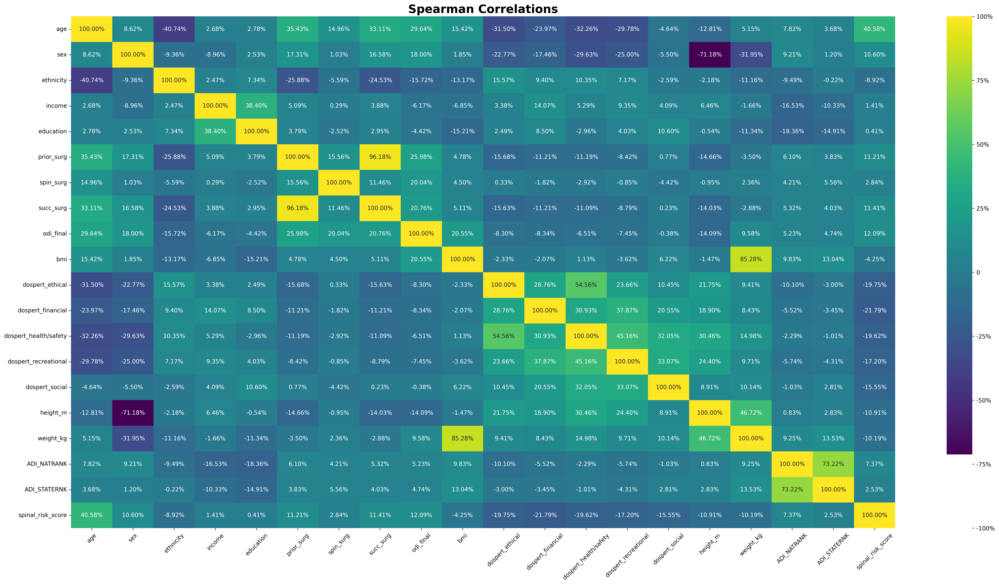

In [12]:
plt.figure(figsize=(32, 16), dpi=300)
ax = sns.heatmap(corr_df.corr(method='spearman'), annot=True, cmap='viridis', fmt='.2%')
plt.xticks(rotation=45)
plt.title('Spearman Correlations', fontsize=20, weight='bold')
cbar = ax.collections[0].colorbar
cbar.set_ticks([-1, -.75, -.5, -.25, 0, .25, .5, .75, 1])
cbar.set_ticklabels(['-100%', '-75%', '-50%', '-25%', '0', '25%', '50%', '75%', '100%'])
plt.savefig(os.path.join(WD, 'figures/odi_risk_correlation.png'), bbox_inches='tight')

In [13]:
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data['feature'] = corr_df.columns 
  
# calculating VIF for each feature 
vif_data['vif'] = [variance_inflation_factor(corr_df.values, i) 
                   for i in range(len(corr_df.columns))]
vif_data.sort_values(by='vif', ascending=False, inplace=True)
vif_data

,feature,vif
16,weight_kg,177.555299
9,bmi,174.379649
15,height_m,106.702124
5,prior_surg,55.984802
7,succ_surg,50.717922
14,dospert_social,26.141228
1,sex,18.356800
19,spinal_risk_score,16.622787
4,education,16.281954
0,age,14.689731


In [14]:
df.columns

Index(['record_id', 'risk_1_timestamp', 'age', 'sex', 'height', 'weight',
       'zipcode', 'ethnicity', 'income', 'education', 'prior_surg',
       'spin_surg', 'succ_surg', 'religion', 'odi_1', 'odi_2', 'odi_3',
       'odi_4', 'odi_5', 'odi_6', 'odi_7', 'odi_8', 'odi_9', 'odi_10',
       'exer_50improv_1drop', 'exer_50improv_10drop', 'exer_50improv_50drop',
       'exer_50improv_90drop', 'att_check_1', 'exer_90improv_1drop',
       'exer_90improv_10drop', 'exer_90improv_50drop', 'exer_90improv_90drop',
       'exer_50pain_1death', 'exer_50pain_10death', 'exer_50pain_50death',
       'exer_90pain_1death', 'exer_90pain_10death', 'exer_90pain_50death',
       'work_50improv_1drop', 'work_50improv_10drop', 'work_50improv_50drop',
       'work_50improv_90drop', 'work_90improv_1drop', 'work_90improv_10drop',
       'work_90improv_50drop', 'work_50improv_1para', 'work_50improv_10para',
       'work_50improv_50para', 'work_50improv_90para', 'work_90improv_1para',
       'work_90improv_10par

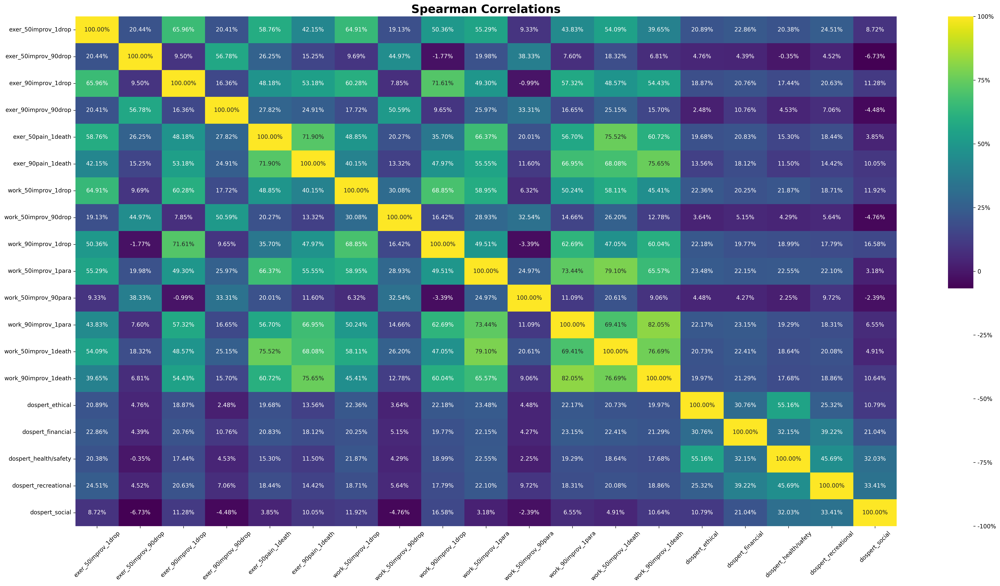

In [15]:
risk_dospert = df.filter(regex='(90|1)(drop|para|death)|dospert_').copy()
plt.figure(figsize=(32, 16), dpi=300)
ax = sns.heatmap(risk_dospert.corr(method='spearman'), annot=True, cmap='viridis', fmt='.2%')
plt.xticks(rotation=45)
plt.title('Spearman Correlations', fontsize=20, weight='bold')
cbar = ax.collections[0].colorbar
cbar.set_ticks([-1, -.75, -.5, -.25, 0, .25, .5, .75, 1])
cbar.set_ticklabels(['-100%', '-75%', '-50%', '-25%', '0', '25%', '50%', '75%', '100%'])
plt.savefig(os.path.join(WD, 'figures/dospert_risk_correlations.png'), bbox_inches='tight')

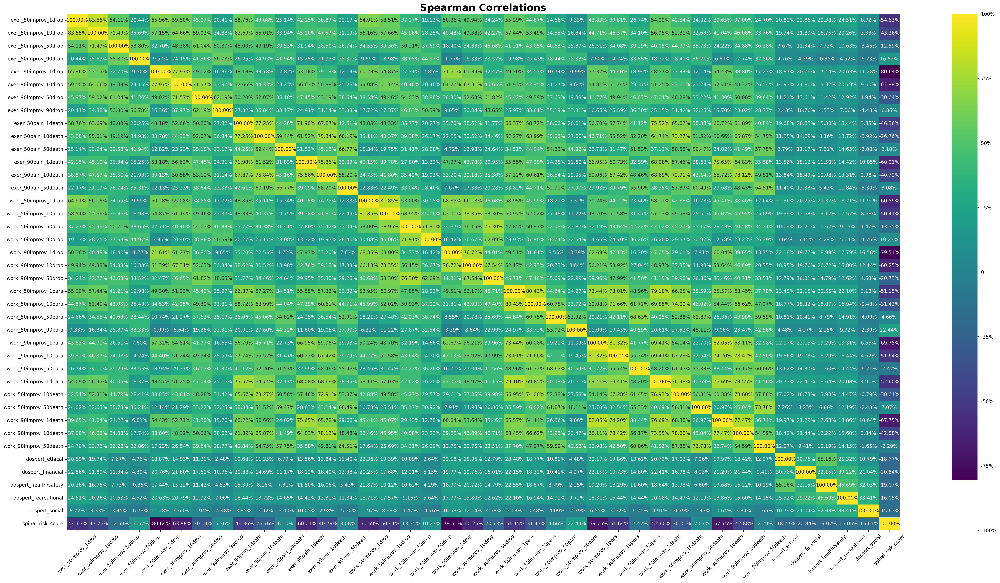

In [16]:
risk_dospert = df.filter(regex='drop|para|death|exer|work|dospert_|spinal_risk_score').copy()
plt.figure(figsize=(32*1.2, 16*1.2), dpi=300)
ax = sns.heatmap(risk_dospert.corr(method='spearman'), annot=True, cmap='viridis', fmt='.2%')
plt.xticks(rotation=45)
plt.title('Spearman Correlations', fontsize=20, weight='bold')
cbar = ax.collections[0].colorbar
cbar.set_ticks([-1, -.75, -.5, -.25, 0, .25, .5, .75, 1])
cbar.set_ticklabels(['-100%', '-75%', '-50%', '-25%', '0', '25%', '50%', '75%', '100%'])
plt.savefig(os.path.join(WD, 'figures/dospert_allrisk_correlations.png'), bbox_inches='tight')

In [17]:
correlations = risk_dospert.corr(method='spearman')
correlations.columns[correlations.iloc[-2, :] < 0.5]

Index(['exer_50improv_1drop', 'exer_50improv_10drop', 'exer_50improv_50drop',
       'exer_50improv_90drop', 'exer_90improv_1drop', 'exer_90improv_10drop',
       'exer_90improv_50drop', 'exer_90improv_90drop', 'exer_50pain_1death',
       'exer_50pain_10death', 'exer_50pain_50death', 'exer_90pain_1death',
       'exer_90pain_10death', 'exer_90pain_50death', 'work_50improv_1drop',
       'work_50improv_10drop', 'work_50improv_50drop', 'work_50improv_90drop',
       'work_90improv_1drop', 'work_90improv_10drop', 'work_90improv_50drop',
       'work_50improv_1para', 'work_50improv_10para', 'work_50improv_50para',
       'work_50improv_90para', 'work_90improv_1para', 'work_90improv_10para',
       'work_90improv_50para', 'work_50improv_1death', 'work_50improv_10death',
       'work_50improv_50death', 'work_90improv_1death',
       'work_90improv_10death', 'work_90improv_50death', 'dospert_ethical',
       'dospert_financial', 'dospert_health/safety', 'dospert_recreational',
       'spinal

In [27]:
risk_dospert.columns

Index(['dospert_ethical', 'dospert_financial', 'dospert_health/safety',
       'dospert_recreational', 'dospert_social', 'spinal_risk_score'],
      dtype='object')

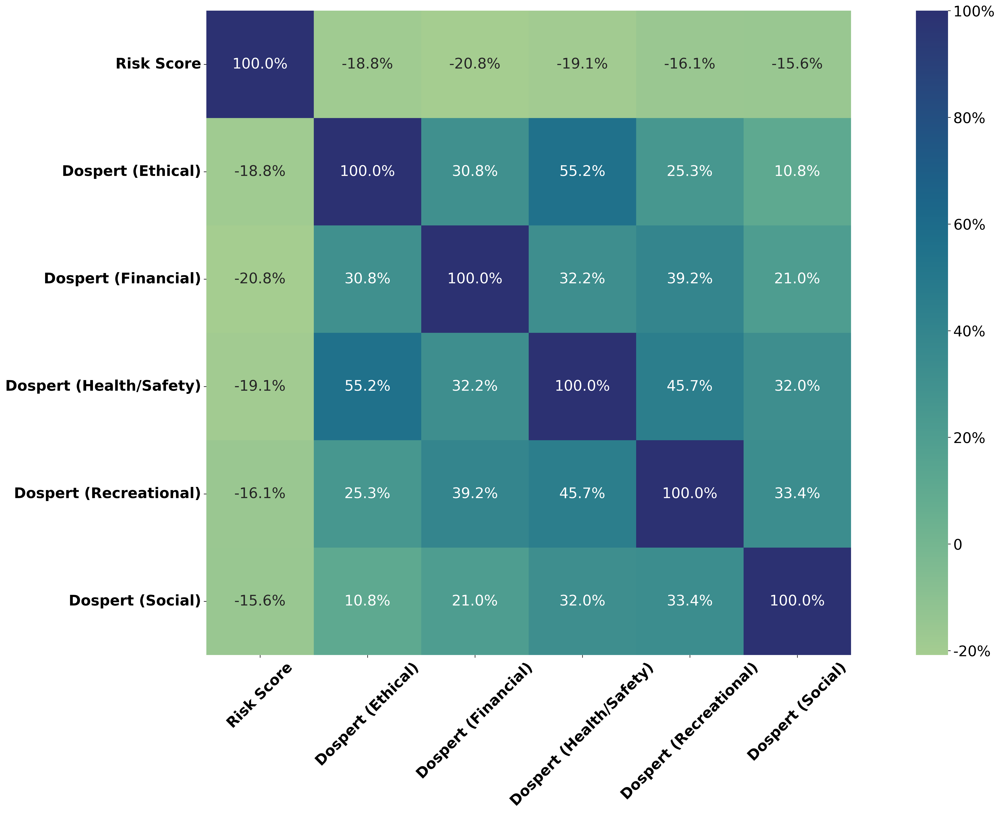

In [55]:
risk_dospert = df.filter(regex='spinal_risk_score|dospert_').copy()
risk_dospert = risk_dospert[['spinal_risk_score', 'dospert_ethical',
                             'dospert_financial', 'dospert_health/safety',
                             'dospert_recreational', 'dospert_social']]
risk_dospert.columns = ['Risk Score', 'Dospert (Ethical)', 'Dospert (Financial)',
                        'Dospert (Health/Safety)', 'Dospert (Recreational)',
                        'Dospert (Social)']
plt.figure(figsize=(32, 16), dpi=300)
ax = sns.heatmap(risk_dospert.corr(method='spearman'), annot=True, cmap='crest',
                 fmt='.1%', square=True, annot_kws={"fontsize": 20})
plt.xticks(rotation=45, weight='bold', fontsize=20)
plt.yticks(rotation=0, weight='bold', fontsize=20)
# plt.title('Spearman Correlations of Risk Score vs Dospert')
cbar = ax.collections[0].colorbar
cbar.set_ticks([-.2, 0, .2, .4, .6, .8, 1])
cbar.set_ticklabels(['-20%', '0', '20%', '40%', '60%', '80%', '100%'], fontsize=20)